## Decision Tree


In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
df=pd.read_csv('Data/Real-Data/Real_Combine.csv')

In [3]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


In [4]:
df.isnull()## checking null value

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
1088,False,False,False,False,False,False,False,False,False
1089,False,False,False,False,False,False,False,False,False
1090,False,False,False,False,False,False,False,False,False
1091,False,False,False,False,False,False,False,False,False


<AxesSubplot:>

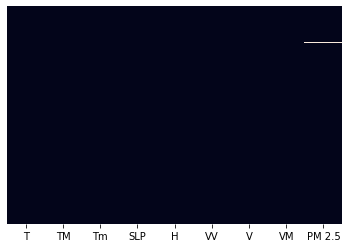

In [5]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False)## beteer way of checking null value

In [6]:
df=df.dropna() ## drop null value as not many

In [7]:
X=df.iloc[:,:-1]##independent feature
y=df.iloc[:,-1]##dependent feature


In [8]:
a=X.isnull()


Correlation Matrix with Heatmap
Correlation states how the features are related to each other or the target variable.

Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

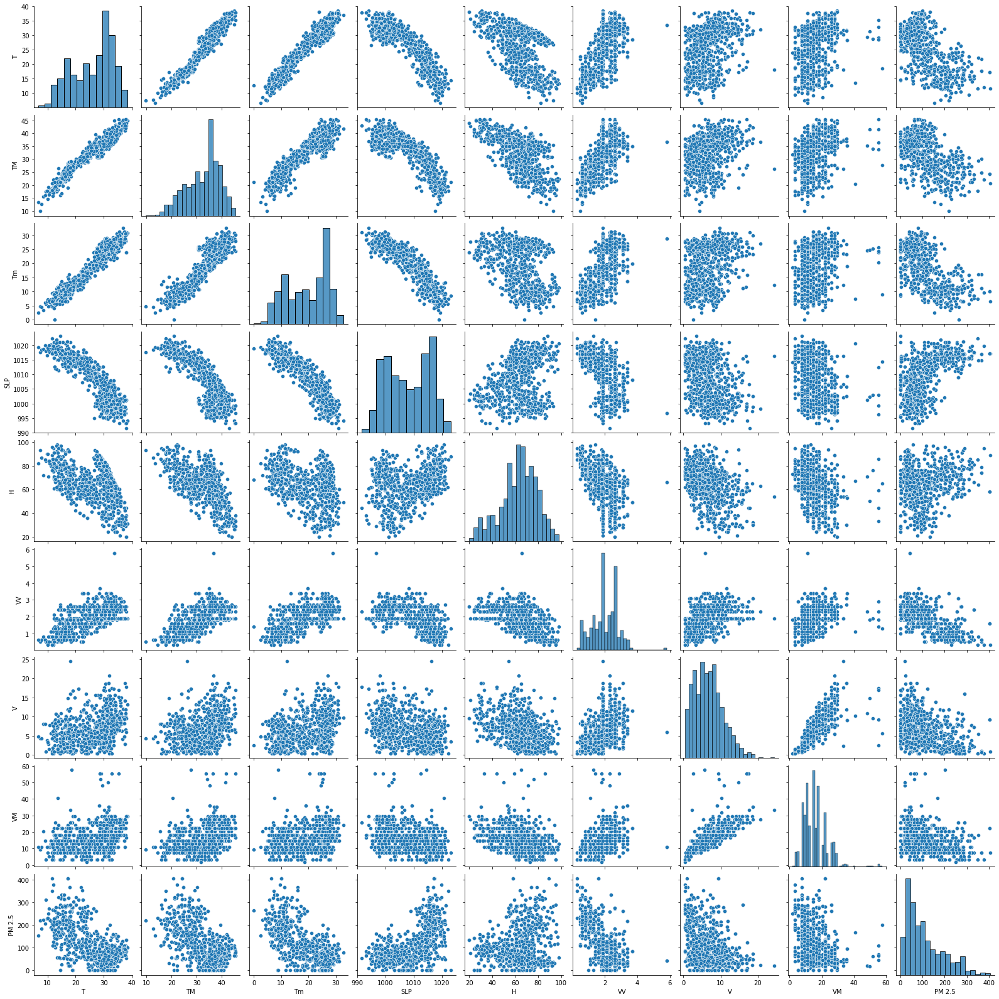

In [9]:
sns.pairplot(df)

In [10]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
VV,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


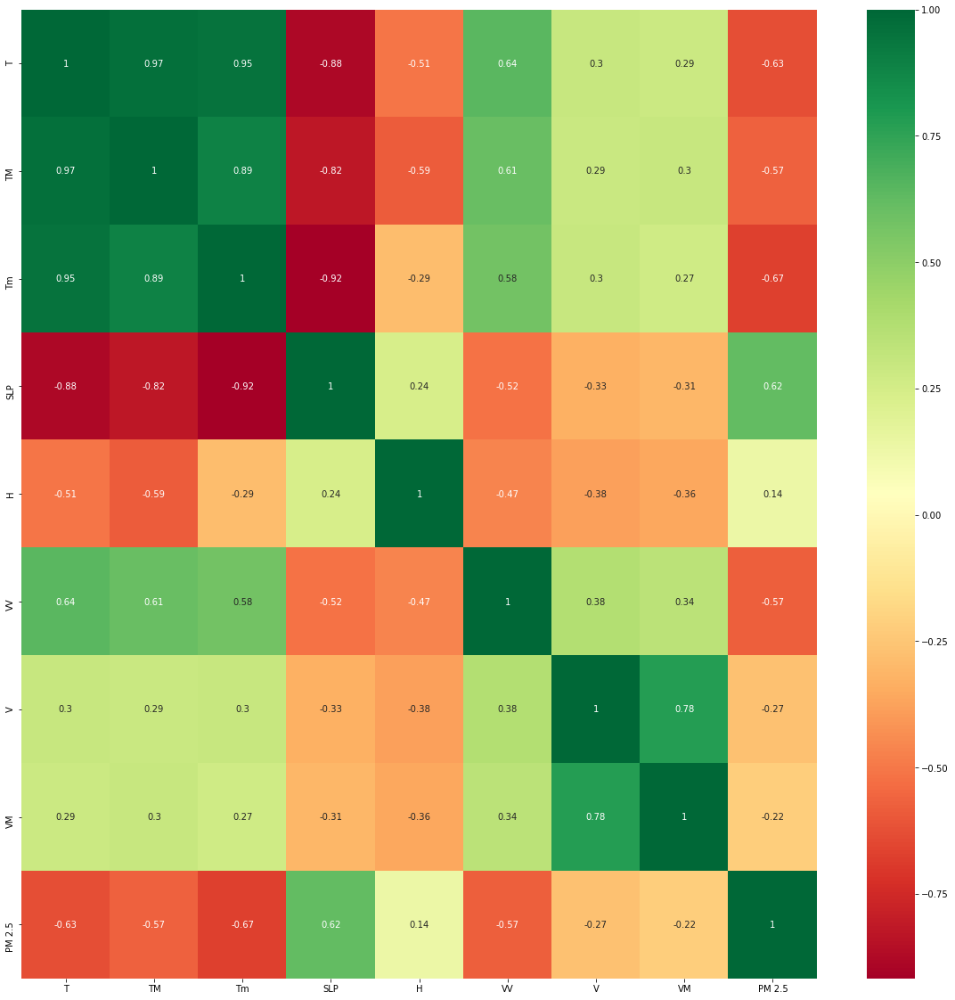

In [11]:
corrmat=df.corr()
top_corr_feature=corrmat.index
top_corr_feature
plt.figure(figsize=(20,20))
g=sns.heatmap(df[top_corr_feature].corr(),annot=True, cmap="RdYlGn")

### Feature Engineering

You can get the feature importance of each feature of your dataset by using the feature importance property of the model.

Feature importance gives you a score for each feature of your data, the higher the score more important or relevant is the feature towards your output variable.

Feature importance is an inbuilt class that comes with Tree Based Regressor, we will be using Extra Tree Regressor for extracting the top 10 features for the dataset.

In [12]:
from sklearn.ensemble import ExtraTreesRegressor


In [13]:
model=ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [14]:
model.feature_importances_

array([0.16141414, 0.10222578, 0.20402681, 0.16651178, 0.08888077,
       0.18060105, 0.05351727, 0.04282239])

In [15]:
feature_imp=pd.Series(model.feature_importances_, index=X.columns)

<AxesSubplot:>

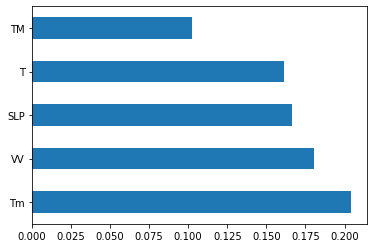

In [16]:
feature_imp.nlargest(5).plot(kind = 'barh')

### Decision Tree

D:\Users\13138\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

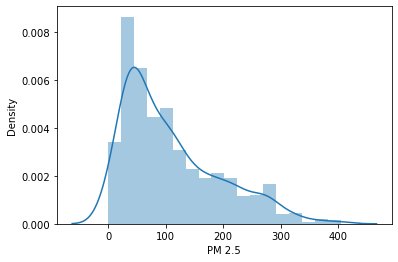

In [17]:
sns.distplot(y)

### Test-Train Split

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test,y_train, y_test= train_test_split(X,y,test_size=0.3)


In [20]:
from sklearn.tree import DecisionTreeRegressor

In [21]:
dtree=DecisionTreeRegressor()
dtree.fit(X_train,y_train)

DecisionTreeRegressor()

In [22]:
dtree.score(X_train,y_train)

1.0

In [23]:
dtree.score(X_test,y_test)

0.7358703042405099

In [24]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree,X,y,cv=5)


In [25]:
score.mean()

0.43809457056185064

### Model Evaluation

In [26]:
prediction=dtree.predict(X_test)


D:\Users\13138\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

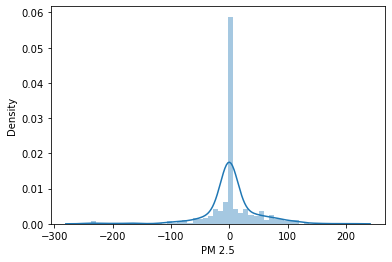

In [28]:
sns.distplot(y_test-prediction)

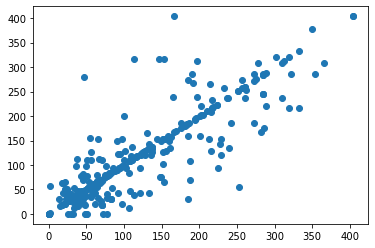

In [29]:
plt.scatter(y_test,prediction)

### Visualizing Trees

In [48]:
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
!pip install pydotplus
import pydotplus
from sklearn.tree import export_graphviz

In [49]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [50]:
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [52]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Hyperparameter Tuning DEcision Tree Regressor

In [30]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [31]:
params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
    
}

In [32]:
from sklearn.model_selection import GridSearchCV

In [34]:
random_search=GridSearchCV(dtree,params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)
random_search.fit(X,y)

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 528 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 5648 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 12816 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 22032 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 33296 tasks      | elapsed:   41.3s
[Parallel(n_jobs=-1)]: Done 46608 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 61968 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 79376 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 98832 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 102385 out of 102400 | elapsed:  2.4min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  2.4min finished


GridSearchCV(cv=10, estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'max_depth': [3, 4, 5, 6, 8, 10, 12, 15],
                         'max_features': ['auto', 'log2', 'sqrt', None],
                         'max_leaf_nodes': [None, 10, 20, 30, 40, 50, 60, 70],
                         'min_samples_leaf': [1, 2, 3, 4, 5],
                         'min_weight_fraction_leaf': [0.1, 0.2, 0.3, 0.4],
                         'splitter': ['best', 'random']},
             scoring='neg_mean_squared_error', verbose=3)

In [35]:
random_search.best_params_

{'max_depth': 6,
 'max_features': None,
 'max_leaf_nodes': 50,
 'min_samples_leaf': 3,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [36]:
random_search.best_score_

-3131.6489619178874

D:\Users\13138\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

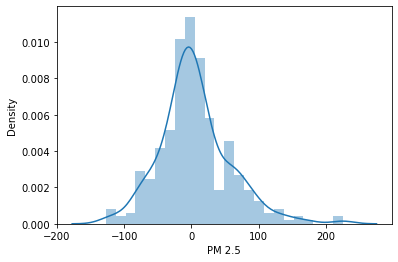

In [37]:
predictions=random_search.predict(X_test)
sns.distplot(y_test-predictions)

### Regression Evaluation Metrics`

Here are three common evaluation metrics for regression problems:

Mean Absolute Error (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$
Mean Squared Error (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$
Root Mean Squared Error (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$
Comparing these metrics:

MAE is the easiest to understand, because it's the average error.
MSE is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units.
All of these are loss functions, because we want to minimize them.

In [38]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 24.07893800813008
MSE: 2102.6111443512873
RMSE: 45.85423801952538


In [39]:

import pickle

In [40]:
# open a file, where you ant to store the data
file = open('decision_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(random_search, file)